# House Price Prediction Assignemnt using Advanced Regression

## Problem Statement:

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file - "train.csv".


The company is looking at prospective properties to buy to enter the market. Its required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:
 * Which variables are significant in predicting the price of a house, and
 * How well those variables describe the price of a house.

 

Also, determine the optimal value of lambda for ridge and lasso regression.

## Business Goal:

Its required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

## Data dictionary

Please refer link for details - https://cdn.upgrad.com/UpGrad/temp/87f67e28-c47e-4725-ae3c-111142c7eaba/data_description.txt

#### High level column defintion is given below:

* **MSSubClass:** Identifies the type of dwelling involved in the sale.	

* **MSZoning:** Identifies the general zoning classification of the sale.
		
	
* **LotFrontage:** Linear feet of street connected to property

* **LotArea:** Lot size in square feet

* **Street:** Type of road access to property

* **Alley:** Type of alley access to property

* **LotShape:** General shape of property
       
* **LandContour:** Flatness of the property

* **Utilities:** Type of utilities available
	
* **LotConfig:** Lot configuration

	
* **LandSlope:** Slope of property
	
	
* **Neighborhood:** Physical locations within Ames city limits

			
* **Condition1:** Proximity to various conditions
	
	
* **Condition2:** Proximity to various conditions (if more than one is present)
	
	
* **BldgType:** Type of dwelling
	
	
* **HouseStyle:** Style of dwelling
	
	
* **OverallQual:** Rates the overall material and finish of the house

	
* **OverallCond:** Rates the overall condition of the house
		
* **YearBuilt:** Original construction date

* **YearRemodAdd:** Remodel date (same as construction date if no remodeling or additions)

* **RoofStyle:** Type of roof

		
* **RoofMatl:** Roof material

		
* **Exterior1st:** Exterior covering on house

	
* **Exterior2nd:** Exterior covering on house (if more than one material)

      
	
* **MasVnrType:** Masonry veneer type

	
* **MasVnrArea:** Masonry veneer area in square feet

* **ExterQual:** Evaluates the quality of the material on the exterior 
		
     
		
* **ExterCond:** Evaluates the present condition of the material on the exterior
		
      
		
* **Foundation:** Type of foundation
		
      
		
* **BsmtQual:** Evaluates the height of the basement

      
		
* **BsmtCond:** Evaluates the general condition of the basement

	
* **BsmtExposure:** Refers to walkout or garden level walls

	
* **BsmtFinType1:** Rating of basement finished area

		
* **BsmtFinSF1:** Type 1 finished square feet

* **BsmtFinType2:** Rating of basement finished area (if multiple types)

      
* **BsmtFinSF2:** Type 2 finished square feet

* **BsmtUnfSF:** Unfinished square feet of basement area

* **TotalBsmtSF:** Total square feet of basement area

* **Heating:** Type of heating
	
		
* **HeatingQC:** Heating quality and condition

		
* **CentralAir:** Central air conditioning

		
* **Electrical:** Electrical system

		
* **1stFlrSF:** First Floor square feet
 
* **2ndFlrSF:** Second floor square feet

* **LowQualFinSF:** Low quality finished square feet (all floors)

* **GrLivArea:** Above grade (ground) living area square feet

* **BsmtFullBath:** Basement full bathrooms

* **BsmtHalfBath:** Basement half bathrooms

* **FullBath:** Full bathrooms above grade

* **HalfBath:** Half baths above grade

* **Bedroom:** Bedrooms above grade (does NOT include basement bedrooms)

* **Kitchen:** Kitchens above grade

* **KitchenQual:** Kitchen quality

       	
* **TotRmsAbvGrd:** Total rooms above grade (does not include bathrooms)

* **Functional:** Home functionality (Assume typical unless deductions are warranted)

		
* **Fireplaces:** Number of fireplaces

* **FireplaceQu:** Fireplace quality
		
* **GarageType:** Garage location
		
		
* **GarageYrBlt:** Year garage was built
		
* **GarageFinish:** Interior finish of the garage

		
* **GarageCars:** Size of garage in car capacity

* **GarageArea:** Size of garage in square feet

* **GarageQual:** Garage quality
		
* **GarageCond:** Garage condition
		
* **PavedDrive:** Paved driveway		
* **WoodDeckSF:** Wood deck area in square feet

* **OpenPorchSF:** Open porch area in square feet

* **EnclosedPorch:** Enclosed porch area in square feet

* **3SsnPorch:** Three season porch area in square feet

* **ScreenPorch:** Screen porch area in square feet

* **PoolArea:** Pool area in square feet

* **PoolQC:** Pool quality
				
* **Fence:** Fence quality		
	
* **MiscFeature:** Miscellaneous feature not covered in other categories
				
* **MiscVal:** $Value of miscellaneous feature

* **MoSold:** Month Sold (MM)

* **YrSold:** Year Sold (YYYY)

* **SaleType:** Type of sale
		
* **SaleCondition:** Condition of sale


## Import Libraries

In [102]:
# Importing the required libraries
from pprint import pprint
import numpy as np
import pandas as pd

# Vizulization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Suppress Warning
import warnings
warnings.filterwarnings("ignore")

import random

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer
from sklearn.feature_selection import RFE
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

from statsmodels.stats.outliers_influence import variance_inflation_factor

In [103]:
# Display all rows and columns
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

## Data understanding, preparation

In [104]:
## Loading the Dataset

df =  pd.read_csv('train.csv',low_memory=False)

In [105]:
## Checking the shape of the dataset 

df.shape


(1460, 81)

In [106]:
# sample records
df.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [107]:
# Looking at the descriptive statistics of the data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


#### Checking for missing values , unique value counts,data types etc

In [108]:
# Function to get dataset info,datatype, unique values etc
def dataframe_details(df):
    temp_df = pd.DataFrame({'column_name': df.columns,
                            'data_type': df.dtypes,
                            'total_count':df.count(),
                            'uniq_value_count':df.nunique(),
                            'missing_count': df.isnull().sum() ,
                            'missing_percent':round(df.isnull().mean() * 100,2) ,
                            'sample_values':df.apply(lambda col: col.unique()[0:10])
                            }
                            ,columns = ['column_name', 'data_type', 'total_count','uniq_value_count','missing_count','missing_percent','sample_values']
                                 )
    temp_df.sort_values(['missing_percent','column_name'], inplace=True ,ascending= False)
    temp_df.reset_index(drop=True,inplace=True)
    return temp_df

df_details = dataframe_details(df)
df_details.sort_values('missing_percent', inplace=True, ascending= False)
df_details

,column_name,data_type,total_count,uniq_value_count,missing_count,missing_percent,sample_values
0,PoolQC,object,7,3,1453,99.52,"[nan, Ex, Fa, Gd]"
1,MiscFeature,object,54,4,1406,96.30,"[nan, Shed, Gar2, Othr, TenC]"
2,Alley,object,91,2,1369,93.77,"[nan, Grvl, Pave]"
3,Fence,object,281,4,1179,80.75,"[nan, MnPrv, GdWo, GdPrv, MnWw]"
4,FireplaceQu,object,770,5,690,47.26,"[nan, TA, Gd, Fa, Ex, Po]"
5,LotFrontage,float64,1201,110,259,17.74,"[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan..."
6,GarageYrBlt,float64,1379,97,81,5.55,"[2003.0, 1976.0, 2001.0, 1998.0, 2000.0, 1993...."
7,GarageType,object,1379,6,81,5.55,"[Attchd, Detchd, BuiltIn, CarPort, nan, Basmen..."
9,GarageFinish,object,1379,3,81,5.55,"[RFn, Unf, Fin, nan]"
10,GarageCond,object,1379,5,81,5.55,"[TA, Fa, nan, Gd, Po, Ex]"


In [109]:
## From the above data we can see that below columns have more than 40% null values.
df_details[df_details['missing_percent']>40]['column_name'].to_list()


['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu']

In [110]:
# Separating the Numerical and Categorical features for analysis
types = df.dtypes
#numerical values are either type int or float
numerical  = types[(types == 'int64') | (types == float)].index.to_list() 
numerical.sort()

#categorical values are type object
categorical = types[types == object].index.to_list()
categorical.sort()

print("Category variables:")
pprint(categorical)
print("\n\nNumerical variables:")
pprint(numerical)

print("Numerical features: {} and Categorical Features: {}".format(len(numerical), len(categorical)))

Category variables:
['Alley',
 'BldgType',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'BsmtQual',
 'CentralAir',
 'Condition1',
 'Condition2',
 'Electrical',
 'ExterCond',
 'ExterQual',
 'Exterior1st',
 'Exterior2nd',
 'Fence',
 'FireplaceQu',
 'Foundation',
 'Functional',
 'GarageCond',
 'GarageFinish',
 'GarageQual',
 'GarageType',
 'Heating',
 'HeatingQC',
 'HouseStyle',
 'KitchenQual',
 'LandContour',
 'LandSlope',
 'LotConfig',
 'LotShape',
 'MSZoning',
 'MasVnrType',
 'MiscFeature',
 'Neighborhood',
 'PavedDrive',
 'PoolQC',
 'RoofMatl',
 'RoofStyle',
 'SaleCondition',
 'SaleType',
 'Street',
 'Utilities']


Numerical variables:
['1stFlrSF',
 '2ndFlrSF',
 '3SsnPorch',
 'BedroomAbvGr',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtFullBath',
 'BsmtHalfBath',
 'BsmtUnfSF',
 'EnclosedPorch',
 'Fireplaces',
 'FullBath',
 'GarageArea',
 'GarageCars',
 'GarageYrBlt',
 'GrLivArea',
 'HalfBath',
 'Id',
 'KitchenAbvGr',
 'LotArea',
 'LotFrontage',
 'LowQualFinSF',
 'MSSubClass

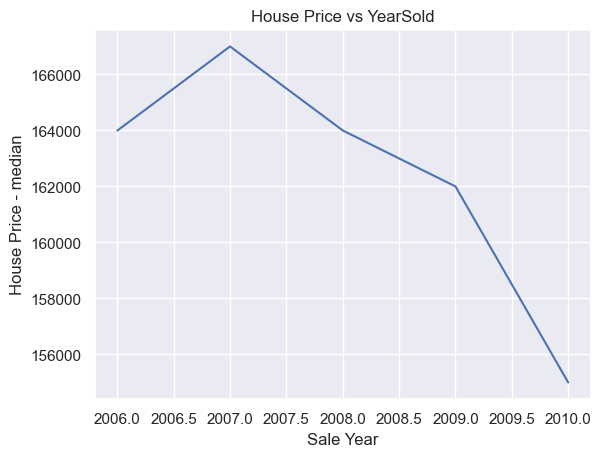

In [111]:
## Evaluate median price changes vs with the year.This is based on intuation that as the property ages, there will be a decline in price.

df['YrSold'] = df['YrSold'].astype('int')
df.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel('Sale Year')
plt.ylabel('House Price - median')
plt.title("House Price vs YearSold")
plt.show()

<font color = "blue"> Inference:

Sharp decline in house prices can be observed following 2007 and 2008 . </font>

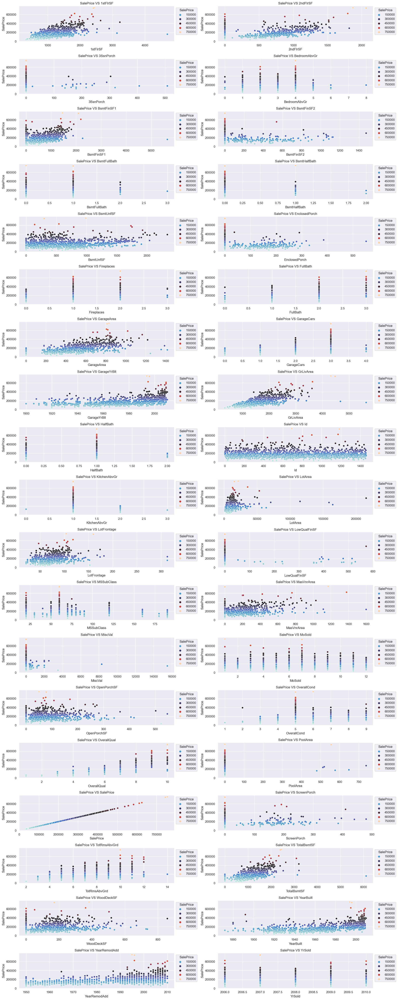

In [112]:
## Creating scatter plots to further analyse the spread of data

numericals = df[numerical]
fig,axs= plt.subplots(19,2,figsize=(20,50))
for i,ax in zip(numericals.columns,axs.flatten()):
    sns.scatterplot(x=i, y='SalePrice', hue='SalePrice',data=numericals,ax=ax,palette='icefire')
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    plt.xlabel(i,fontsize=12)
    plt.ylabel('SalePrice',fontsize=12)
    ax.set_title('SalePrice'+' VS '+str(i))
    fig.tight_layout()

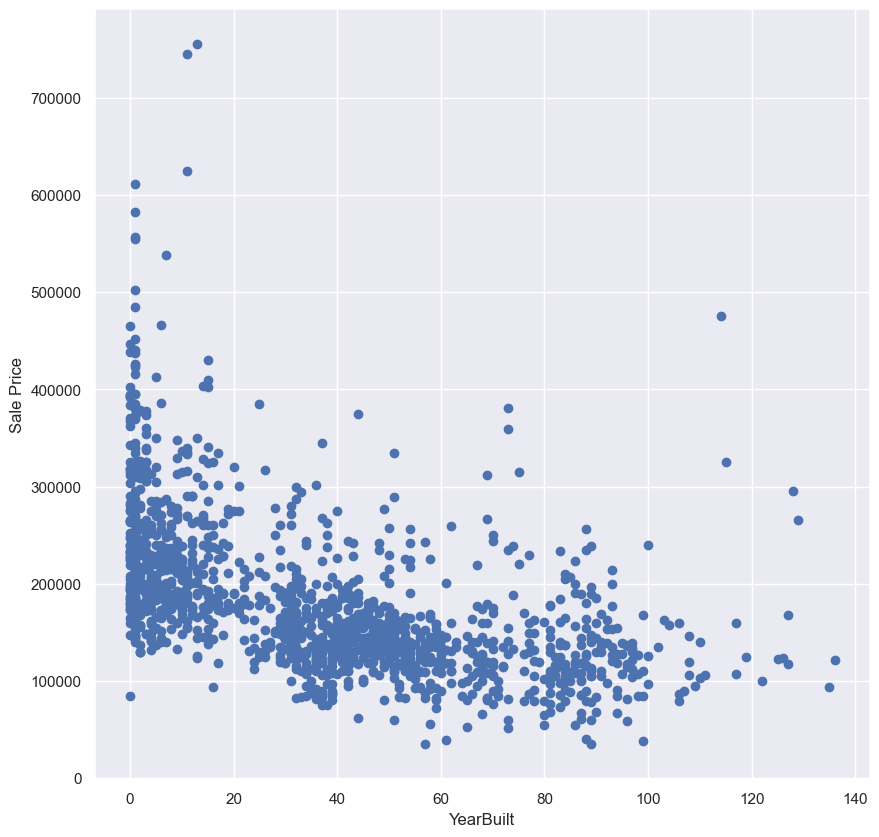

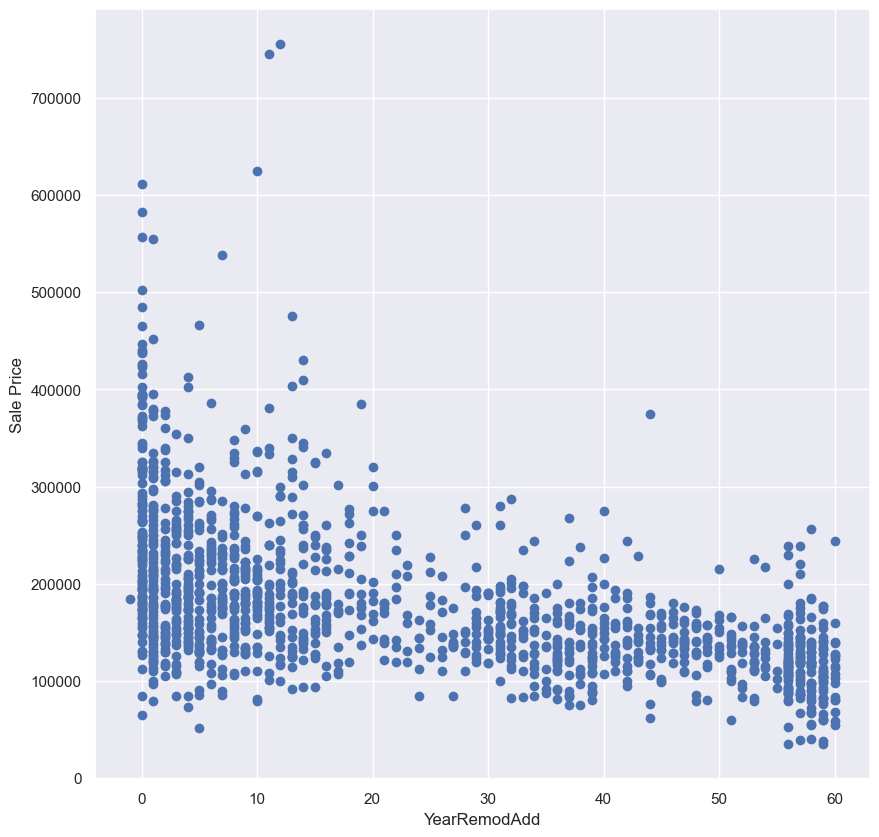

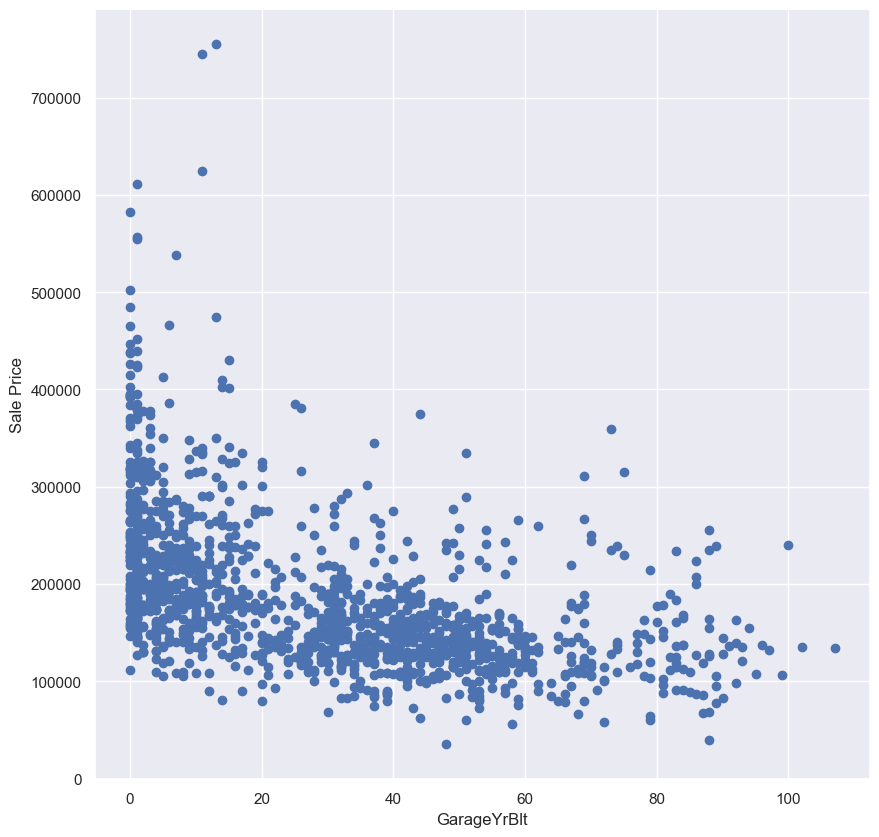

In [113]:
# Comparing the Age of the Building / Renovated Building / Garage with the Sold Price
year_features = ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

for feature in year_features:
    if feature!='YrSold':
        data_temp=df.copy()
        plt.figure(figsize=(10,10))
        data_temp[feature]=data_temp['YrSold']-df[feature]
        plt.scatter(data_temp[feature],data_temp['SalePrice'])
        plt.xlabel(feature)
        plt.ylabel('Sale Price')
        plt.show()

<font color="blue"> 
Inference

1. We have observed several features have missing data.

2. ID contains only Unique Identification Numbers that will add no value to the Predications.Hence it will be dropped.

3. Older Properties are have lower price than Newer Properties.

4. Property Prices and Total Basement Area seem to be have a direct corelation. There is a Linear Relationship between them.


## Data Cleaning and Transformation

In [114]:
def missing_values(df):
   missing_data_ = pd.DataFrame({"Column":df.columns,"Missing %":['%.2f' % (a/len(df)*100) for a in df.isnull().sum()],
   "Feature":["Continuous" if df[col].dtype != 'O' else "Ordinal" for col in df.columns ]}) 
   return missing_data_

In [115]:
temp_data = missing_values(df)
temp_data[temp_data["Missing %"]!="0.00"].sort_values(by="Missing %",ascending=False)

,Column,Missing %,Feature
72,PoolQC,99.52,Ordinal
74,MiscFeature,96.30,Ordinal
6,Alley,93.77,Ordinal
73,Fence,80.75,Ordinal
64,GarageCond,5.55,Ordinal
58,GarageType,5.55,Ordinal
59,GarageYrBlt,5.55,Continuous
60,GarageFinish,5.55,Ordinal
63,GarageQual,5.55,Ordinal
57,FireplaceQu,47.26,Ordinal


In [116]:
## Drop the ID Column since this will not add value to the prediction of house prices
df.drop("Id",axis=1,inplace=True)

In [117]:
## Keeping a arbitary threshold value of 80%, the below four columns are removed
df.drop(["PoolQC","MiscFeature","Alley","Fence"],axis=1,inplace=True)

In [118]:
temp_data = missing_values(df)
temp_data[temp_data["Missing %"]!="0.00"].sort_values(by="Missing %",ascending=False)

,Column,Missing %,Feature
56,GarageType,5.55,Ordinal
57,GarageYrBlt,5.55,Continuous
58,GarageFinish,5.55,Ordinal
61,GarageQual,5.55,Ordinal
62,GarageCond,5.55,Ordinal
55,FireplaceQu,47.26,Ordinal
30,BsmtExposure,2.60,Ordinal
33,BsmtFinType2,2.60,Ordinal
28,BsmtQual,2.53,Ordinal
29,BsmtCond,2.53,Ordinal


### Individually Identify and Transform data as per Requirement

In [119]:
# Fill the null values for the features

fill_=["GarageType","FireplaceQu","BsmtFinType1","BsmtFinType2","BsmtQual","BsmtCond",
           "BsmtExposure","GarageFinish","GarageQual","GarageCond","MasVnrType"]
for f in fill_:
    df[f].fillna("No",inplace=True)

In [120]:
temp_data = missing_values(df)
temp_data[temp_data["Missing %"]!="0.00"].sort_values(by="Missing %",ascending=False)

,Column,Missing %,Feature
57,GarageYrBlt,5.55,Continuous
2,LotFrontage,17.74,Continuous
24,MasVnrArea,0.55,Continuous
40,Electrical,0.07,Ordinal


In [121]:
## OverallQual: Catagorical variable with numeric catagories
## Convert Numbers to Categories
map_ = {1:"VP",2:"PO",3:"FA",4:"BA",5:"AV",6:"AA",7:"GO",8:"VG",9:"EX",10:"VE"}
df.OverallQual=df.OverallQual.map(map_)
df.OverallQual.value_counts()

AV    397
AA    374
GO    319
VG    168
BA    116
EX     43
FA     20
VE     18
PO      3
VP      2
Name: OverallQual, dtype: int64

In [122]:
## MSSubClass is a catagorical variable with numeric catagories
## Convert Numbers to Categories
## Value Count of the MSSubClass
print(sorted(df.MSSubClass.value_counts().index))

map_={20:"1storyNew",30:"1storyOld",40:"1storywAttic",45:"1_5storyUnF",50:"1_5storyF",60:"2storyNew",70:"2storyOld",75:"2_5story",
      80:"Multi",85:"Split",90:"Duplex",120:"1storyPUDnew",160:"2storyPUDnew",180:"PUDmulti",190:"2Family"}

df.MSSubClass = df.MSSubClass.map(map_)

[20, 30, 40, 45, 50, 60, 70, 75, 80, 85, 90, 120, 160, 180, 190]


In [123]:
## Value Count of the MSSubClass
df.MSSubClass.value_counts()

1storyNew       536
2storyNew       299
1_5storyF       144
1storyPUDnew     87
1storyOld        69
2storyPUDnew     63
2storyOld        60
Multi            58
Duplex           52
2Family          30
Split            20
2_5story         16
1_5storyUnF      12
PUDmulti         10
1storywAttic      4
Name: MSSubClass, dtype: int64

In [124]:
## Lot Frontage - Data stats
df.LotFrontage.describe()

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

<Axes: xlabel='LotFrontage', ylabel='LotArea'>

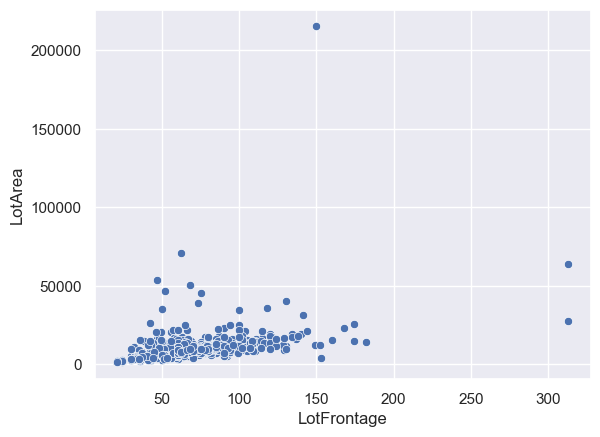

In [125]:
## Look for LotArea and Frontage Relationship
sns.scatterplot(data=df,x='LotFrontage',y='LotArea')

<font color="blue"> 
Inference:

Quite a lot of outliers exist.

In [126]:
## Remove the outliers in LotFrontage
temp_df1 = df[df.LotArea<100000]
temp_df2 = temp_df1[temp_df1.LotFrontage<200]

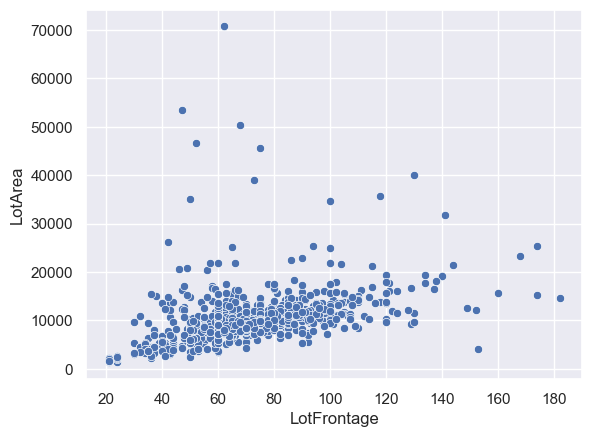

In [127]:
## Look for LotArea and Frontage Relationship again
sns.scatterplot(data=temp_df2,x='LotFrontage',y='LotArea')
plt.show()

In [128]:
# As per the data dictionary "LotFrontage" is Linear feet of street connected to property.  
# Since it is a numeric with a fair distribution, it can be imputed with similar 'Neighborhood' values
df['LotFrontage'] = df.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))


In [129]:
## Re-evaluate Missing Values
temp_data = missing_values(df)
temp_data[temp_data["Missing %"]!="0.00"].sort_values(by="Missing %",ascending=False)

,Column,Missing %,Feature
57,GarageYrBlt,5.55,Continuous
24,MasVnrArea,0.55,Continuous
40,Electrical,0.07,Ordinal


In [130]:
# Replacing NULL values for GarageYrBlt with median value.
df.GarageYrBlt.fillna(round(df["GarageYrBlt"].median(),0), inplace=True)

In [131]:
# Below columns have very less missing values and hence rceords can be dropped.
columns_to_drop_rows = [
                         'MasVnrArea' # only 8 record with missing value
                        ,'Electrical' # only 1 record with missing value
]
df.dropna(subset= columns_to_drop_rows ,axis= 0, inplace= True)

df.shape

(1451, 76)

In [132]:
df.LotArea.describe()

count      1451.000000
mean      10507.808408
std        9992.987081
min        1300.000000
25%        7537.500000
50%        9477.000000
75%       11600.000000
max      215245.000000
Name: LotArea, dtype: float64

In [133]:
## Drop Lot area larger than 100000
new_df = df[df.LotArea<100000]
df = new_df

<font color="blue"> All missing data handled 

### Data Visulization

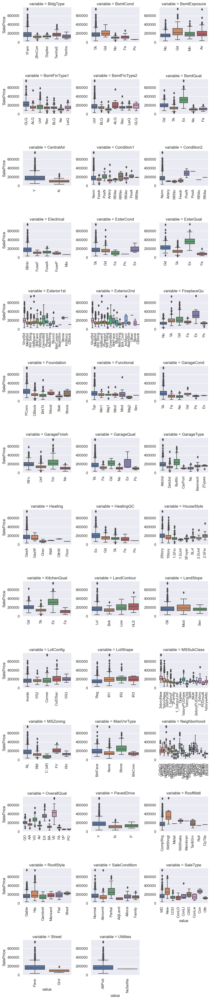

In [134]:
## Categorical Features vs SalePrice
def facetgrid_boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
    
categorical = df.select_dtypes(exclude=['int64','float64'])
f = pd.melt(df, id_vars=['SalePrice'], value_vars=sorted(df[categorical.columns]))
g = sns.FacetGrid(f, col="variable", col_wrap=3, sharex=False, sharey=False)
g = g.map(facetgrid_boxplot, "value", "SalePrice")

> Inference

<font color="blue"> 1. Higher Property prices if the basement quality is Good or Excellent <p> </font>
<font color="blue"> 2. Higher Property prices if the basement condition is Good and Excellent  <p> </font>
<font color="blue"> 3. Higher Property prices if the Kitchen is Good Quality <p> </font>
<font color="blue"> 4. Higher Property prices that have Paved alleys <p> </font>


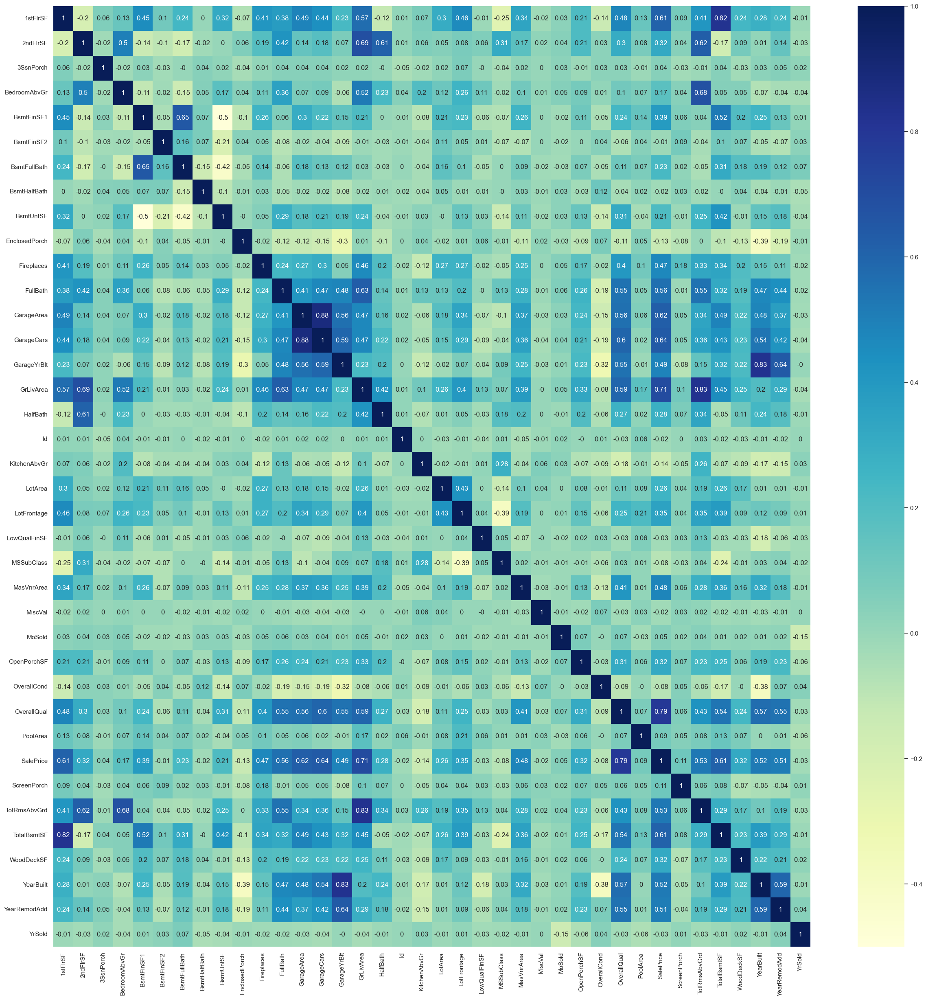

In [135]:
## Plotting the Corelation
plt.subplots(figsize = (30,30))
sns.heatmap(round(numericals.corr(),2), cmap='YlGnBu' , annot=True)
plt.show()

<font color="blue"> 
Inference:

1. GarageArea and GaragCars have high correlations
2. GrLivArea and TotRmsAbvGrd have high correlations
3. TotalBSMTSF and 1stFlrSF have high correlations



In [136]:
#Custom funtions for analisys 
def hist_show(col,y=7):
    sns.histplot(col ,bins=y,kde=True)
    plt.show()

In [137]:
## Get Categorical and Numerical Data counts

categorical = []
numerical = []
for i in df.columns:
    if df[i].dtypes != 'O':
        numerical.append(i)
    else:
        categorical.append(i)
print("Numerical features: {} and Categorical Features: {}".format(len(numerical), len(categorical)))

Numerical features: 35 and Categorical Features: 41


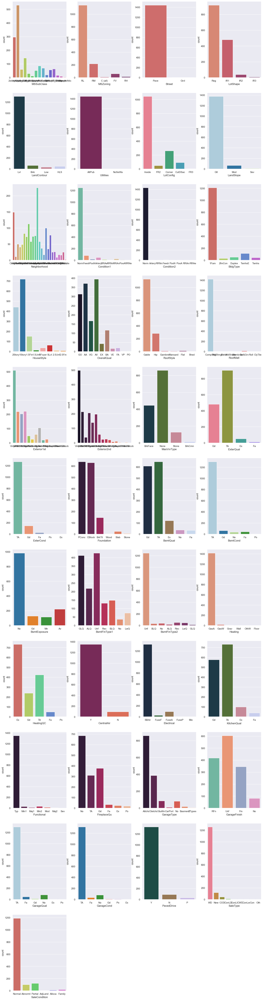

In [138]:
plt.figure(figsize=(20, 80))
r = 1
pal = ["tab10","hls","husl","Set2","Paired","flare","rocket","cubehelix"]
for c in categorical:
    plt.subplot(11, 4, r)
    sns.countplot(data = df,x = c,palette = random.choice(pal))
    r = r + 1
plt.show()

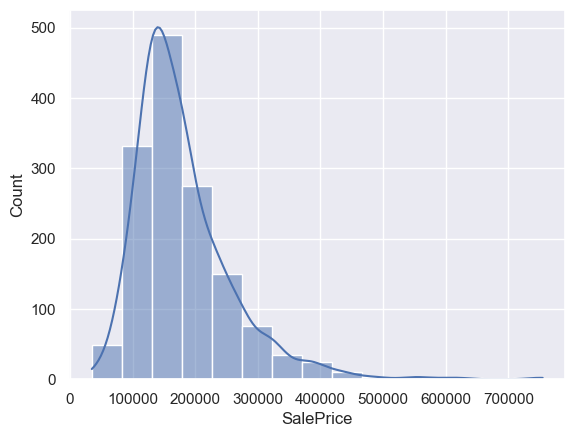

In [139]:
## Data skew in SalePrice
hist_show(df.SalePrice,15)
plt.show()

In [140]:
## Dropping the skewed  Features
drp = ['Heating','Functional','Utilities','LandSlope','LandContour','Electrical','Condition1','Condition2']
df.drop(drp,axis=1,inplace=True)
for x in drp:
    categorical.remove(x)

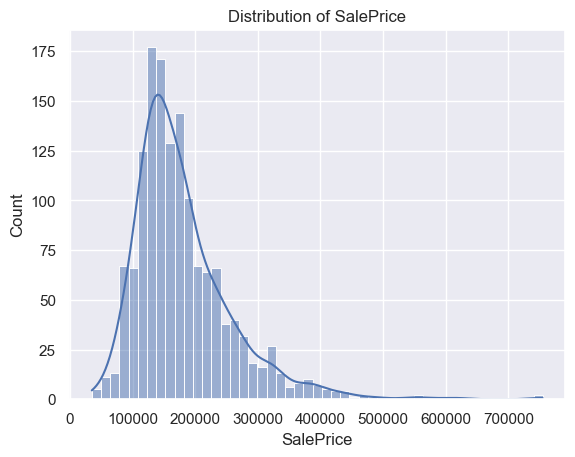

In [141]:
# Checking distribution of Target variable SalePrice
plt.title('Distribution of SalePrice')
sns.histplot(data=df['SalePrice'], kde=True)
plt.show()

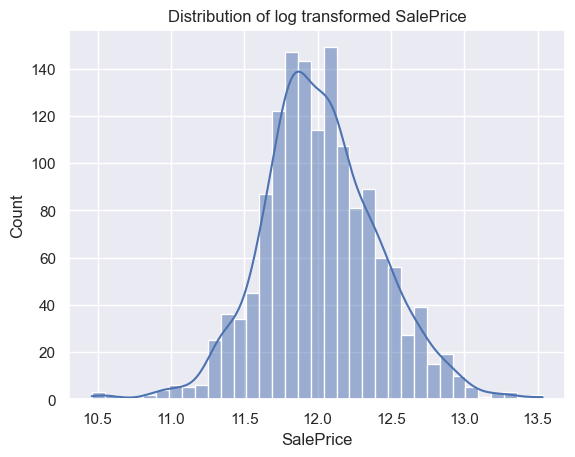

In [142]:
# Since SalePrice is highly right skewed, checking the distribution of transformed SalePrice.
plt.title('Distribution of log transformed SalePrice')
sns.histplot( data=np.log(df['SalePrice']), kde=True)
plt.show()

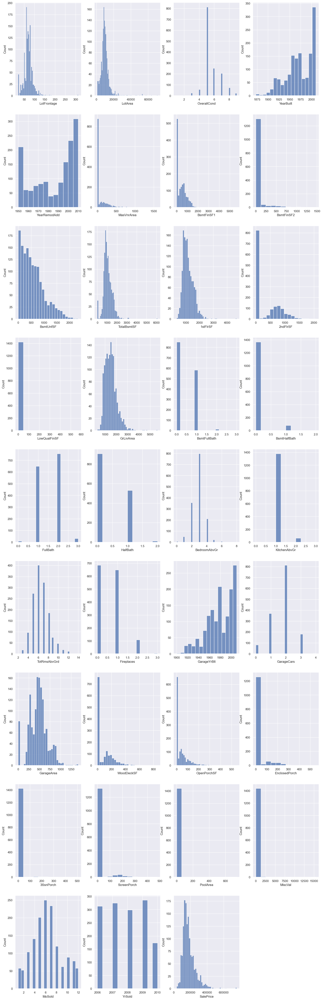

In [143]:
# After the cleanup Vizualize the chceck the numeric columns 
plt.figure(figsize=(20, 80))
r = 1
for n in numerical:
    plt.subplot(11,4,r)
    sns.histplot(data = df,x = n)
    r = r + 1
plt.show()

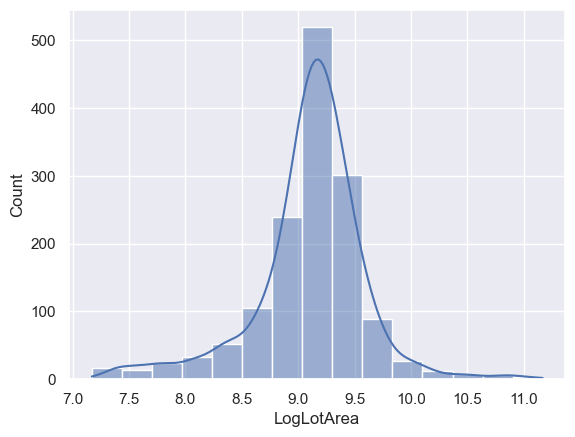

In [144]:
## Normalized with log funtion 
df['LogLotArea'] = np.log(df.LotArea)

## Vizualize the LogLotArea 
hist_show(df.LogLotArea,15)

In [145]:
## Create a LogScale for the SalePrice
df['Logsale'] = np.log(df.SalePrice)

## Replacing the SalePrice Remove LogSalePrice
df.SalePrice = df.Logsale
df.drop("Logsale", axis = 1,inplace = True)

In [146]:
## Remove/append the Features from the DF and the List
df.drop("LotArea",axis=1,inplace=True)
numerical.remove("LotArea")
numerical.append("LogLotArea")

In [147]:
## Convert to Age for Year Built And Years Since Remodel Bais current Year
df['Age'] = 2023 - df.YearBuilt
df['YrSinceRemod'] = 2023 - df.YearRemodAdd

In [148]:
## YrSinceRemod Stats
df.YrSinceRemod.describe()

count    1447.000000
mean       38.239115
std        20.654292
min        13.000000
25%        19.000000
50%        30.000000
75%        56.500000
max        73.000000
Name: YrSinceRemod, dtype: float64

In [149]:
## Age Stats
df.Age.describe()

count    1447.000000
mean       51.890117
std        30.229179
min        13.000000
25%        23.000000
50%        51.000000
75%        69.000000
max       151.000000
Name: Age, dtype: float64

In [150]:
## Drop the YearBuilt and YearRemodAdd
df.drop('YearRemodAdd', axis = 1, inplace = True)
df.drop('YearBuilt', axis = 1, inplace = True)

In [151]:
## 98% - 95% of 3SsnPorch, LowQualFinSF, MiscVal has no data - Drop these Feature
df.drop('3SsnPorch', axis = 1, inplace = True)
df.drop("LowQualFinSF",axis = 1, inplace = True)
df.drop("MiscVal", axis = 1, inplace = True)

In [152]:
## Remove the Features from the Numerical List
for n in ['3SsnPorch',"YearBuilt","YearRemodAdd","LowQualFinSF","MiscVal"]:
    numerical.remove(n)

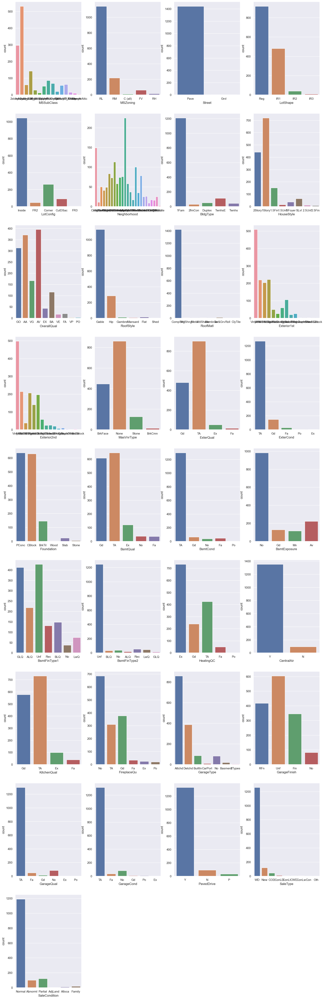

In [153]:
## Recheck the entire Data Set Visually to Identify
plt.figure(figsize = (20, 80))
r = 1
for c in categorical:
    plt.subplot(11, 4, r)
    sns.countplot(data = df, x = c)
    r = r + 1
plt.show()

In [154]:
## Consolidation of  Sale type 
df.loc[df.SaleType=="WD","SaleType"] = 1
df.loc[df.SaleType!=1,"SaleType"] = 0

In [155]:
# Feature Street Contains Single value [Gravel < 5%].Hence dropping it.
df.drop("Street",axis=1,inplace=True)
categorical.remove("Street")

In [156]:
## List of Dummy Variables
dummy = categorical
categorical.remove("SaleType")


In [157]:
## Generic Function to do the Outlier Cleanup

def remove_outlier(dataframe_,feature):
    q1=dataframe_[feature].quantile(0.25)
    q2=dataframe_[feature].quantile(0.75)
    val=1.5*(q2-q1)
    lower_val=q1-val
    upper_val=q2+val
    out_dataframe_ = dataframe_[(dataframe_[feature]>lower_val) & (dataframe_[feature]<upper_val)]
    return out_dataframe_

In [158]:
## Data Visualization 
sns.set(font_scale=8)
feature = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea','TotalBsmtSF', '1stFlrSF','FullBath', 'TotRmsAbvGrd','Age']
sns.pairplot(df[feature], size = 10,)
plt.show()

In [159]:
## Outliers removal for GrLivArea
df = remove_outlier(df, "GrLivArea")

In [160]:
numerical.append("Age")

<font color="blue">
Inference

No realtion between the age of the house and the sale price. 

Higher House Prices for larger living areas and larger garages genraly sell at higher prices. 

House Prices are directly propotional to Number of Garages. Higher prices for houses with higher quality- which is a no brainer

In [161]:
## List of Numerical Features and Categorical Features
numerical = df.select_dtypes(include=["float64","int64"])
print(numerical.columns)
categorical = df.select_dtypes(exclude=["float64","int64"])
print(categorical.columns)

Index(['LotFrontage', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', 'ScreenPorch', 'PoolArea', 'MoSold', 'YrSold',
       'SalePrice', 'LogLotArea', 'Age', 'YrSinceRemod'],
      dtype='object')
Index(['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood',
       'BldgType', 'HouseStyle', 'OverallQual', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'HeatingQC', 'CentralAir', 'KitchenQual', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'SaleType', 'SaleCon

In [162]:
## Data Transform 
categorical['PavedDrive'] = categorical['PavedDrive'].apply(lambda x : 1 if x == 'Y' else 0)
categorical['CentralAir'] = categorical['CentralAir'].apply(lambda x : 1 if x == 'Y' else 0)
                                                  

In [163]:
type(categorical)

pandas.core.frame.DataFrame

In [164]:
re_dummy = pd.DataFrame()
for x in categorical.columns.to_list():
    temp = pd.get_dummies(categorical[x],drop_first=True,prefix_sep="_",prefix=x)
    re_dummy = pd.concat([re_dummy, temp], axis = 1)
pd.set_option('display.max_rows',50)

re_dummy

,MSSubClass_1_5storyUnF,MSSubClass_1storyNew,MSSubClass_1storyOld,MSSubClass_1storyPUDnew,MSSubClass_1storywAttic,MSSubClass_2Family,MSSubClass_2_5story,MSSubClass_2storyNew,MSSubClass_2storyOld,MSSubClass_2storyPUDnew,MSSubClass_Duplex,MSSubClass_Multi,MSSubClass_PUDmulti,MSSubClass_Split,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_AV,OverallQual_BA,OverallQual_EX,OverallQual_FA,OverallQual_GO,OverallQual_PO,OverallQual_VE,OverallQual_VG,OverallQual_VP,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_1,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No,GarageCond_Po,GarageCond_TA,PavedDrive_1,SaleType_1,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,1,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,1,0
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,

In [165]:
# Create a Dataframe for the data set

final_df = pd.concat([numerical, re_dummy], axis = 1)

In [166]:
## Standard steps for creating test and train sets of data
## Data Split is at 70:30
## Random State - 79
X=final_df.drop("SalePrice",axis=1)
y=final_df['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y,
                    train_size=0.7,test_size = 0.3, random_state = 79)


In [167]:
## Some Data Scaling is Required
## MinMax Scaler
scaler = MinMaxScaler()
num_var = numerical.columns.to_list()
num_var.remove("SalePrice")
X_train[num_var] = scaler.fit_transform(X_train[num_var])
X_test[num_var] = scaler.transform(X_test[num_var])


## Linear Regression - Basic

In [168]:
## Build a basic Linear Regression Model
## With basic Recursive Feature Elimination 
lr = LinearRegression()

lr.fit(X_train, y_train)

rfe = RFE( lr, n_features_to_select = 15)
rfe= rfe.fit(X_train,y_train)
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', False, 51),
 ('OverallCond', True, 1),
 ('MasVnrArea', False, 183),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinSF2', False, 22),
 ('BsmtUnfSF', False, 21),
 ('TotalBsmtSF', True, 1),
 ('1stFlrSF', False, 75),
 ('2ndFlrSF', False, 74),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 106),
 ('BsmtHalfBath', False, 116),
 ('FullBath', False, 108),
 ('HalfBath', False, 110),
 ('BedroomAbvGr', False, 78),
 ('KitchenAbvGr', True, 1),
 ('TotRmsAbvGrd', False, 193),
 ('Fireplaces', False, 166),
 ('GarageYrBlt', False, 126),
 ('GarageCars', True, 1),
 ('GarageArea', False, 88),
 ('WoodDeckSF', False, 50),
 ('OpenPorchSF', False, 71),
 ('EnclosedPorch', False, 40),
 ('ScreenPorch', False, 45),
 ('PoolArea', False, 3),
 ('MoSold', False, 199),
 ('YrSold', False, 168),
 ('LogLotArea', True, 1),
 ('Age', True, 1),
 ('YrSinceRemod', False, 81),
 ('MSSubClass_1_5storyUnF', False, 142),
 ('MSSubClass_1storyNew', False, 132),
 ('MSSubClass_1storyOld', False, 94),
 ('MSSubClass_1storyPUDnew'

In [169]:
rfe_fets = X_train.columns[rfe.support_]
list(rfe_fets)

['OverallCond',
 'BsmtFinSF1',
 'TotalBsmtSF',
 'GrLivArea',
 'KitchenAbvGr',
 'GarageCars',
 'LogLotArea',
 'Age',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'OverallQual_EX',
 'OverallQual_PO',
 'RoofMatl_Metal']

In [170]:
drop_fets = X_train.columns[~rfe.support_].to_list
X_train_rfe=X_train[list(rfe_fets)]
lr2 = LinearRegression()
lr2.fit(X_train_rfe,y_train)
LinearRegression()
print(lr2.intercept_)
print(lr2.coef_)

10.814894710507392
[ 0.51406735  0.18607135  0.5643665   0.85935941 -0.43439471  0.28792801
  0.2671053  -0.59036645  0.46446925  0.36513378  0.35841437  0.33066704
  0.22064211 -0.2128659   0.22423574]


In [171]:
## Evaluate Metrics such as R2 score, RSS and RMSE
y_pred_train = lr2.predict(X_train_rfe)
y_pred_test = lr2.predict(X_test[list(rfe_fets)])

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("R2 Train:",r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2 Test",r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("Rss Train:",rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("Rss Test",rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE Train:",mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE Test",mse_test_lr)
metric.append(mse_test_lr**0.5)

R2 Train: 0.8789897279712301
R2 Test 0.8770561739212699
Rss Train: 17.269558063243224
Rss Test 8.007925307397576
MSE Train: 0.017426395623857945
MSE Test 0.01884217719387665


<font color="blue"> 
Inference

We have R2 on Train as 87.89% and test R2 is 87.70% which is good but we can try to improve it



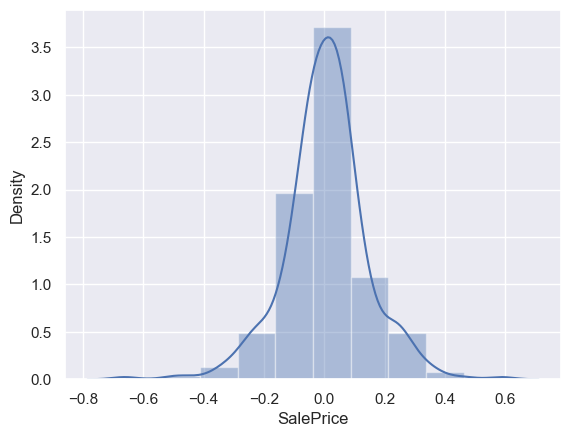

In [172]:
## Plot the Error Distribution
sns.set()
sns.distplot((y_test-y_pred_test), bins = 10)
plt.show()

### Ridge Regression

In [173]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

In [174]:
## Initialize Ridge 
ridge = Ridge()
# Perform Cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train)
print(model_cv.best_params_)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
{'alpha': 4.0}


In [175]:
# Ridge model for alpha = 4
alpha = 4
ridge = Ridge(alpha=alpha)
## Printing coefficients which have been penalised
ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 5.52530039e-02  1.95735325e-01  3.01746850e-02  1.57149890e-01
  4.83983086e-02  4.42141753e-02  1.61717835e-01  1.94324418e-01
  1.07313479e-01  2.61516558e-01  4.63122368e-02  1.87825834e-02
  8.52351150e-02  5.49577111e-02  8.53864707e-03 -3.85317988e-02
  5.39372297e-02  4.39480137e-02  2.70475557e-02  6.34611725e-02
  8.13549622e-02  7.44797302e-02  7.51460639e-02  5.38331756e-02
  7.42035583e-02  7.56700273e-02  9.21943258e-05 -1.46086636e-02
  1.39931157e-01 -1.28913277e-01 -7.31820324e-02 -4.23683357e-03
  2.07496608e-02 -3.96015975e-02 -2.98452941e-03 -2.17104825e-02
 -2.00046961e-02  6.21477819e-03 -3.78104862e-03  5.07856713e-02
 -6.25806569e-02 -1.02682605e-02  9.18702265e-03  7.93737202e-03
  1.02230398e-02  1.24611161e-01  6.51688783e-02  8.02138631e-02
  4.45239219e-02  1.36743997e-02  1.39209097e-03  6.67560830e-03
  3.41954019e-02 -4.07172442e-02 -5.28367519e-03 -1.84617877e-02
  6.80861796e-03 -1.22069043e-03  3.48596410e-02  5.77064253e-03
 -1.38303630e-02  9.96808

In [176]:
## Evaluate Metrics such as R2 score, RSS and RMSE

y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)


0.9336877096140536
0.9060059756022838
9.463526772789027
6.1222848737162945
0.009549472020977827
0.014405376173450104


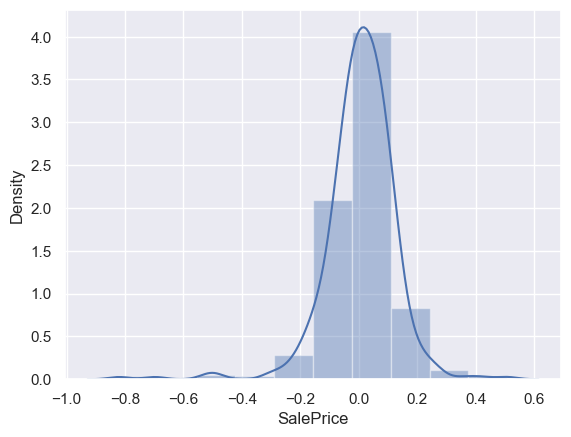

In [177]:
## Plot the Error Distribution
sns.set()
sns.distplot((y_test-y_pred_test), bins=10)
plt.show()

In [178]:
## Initialize Ridge 
lasso = Lasso()
#$ Perform Cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [179]:
## Top hyperparameter Alpha
print(model_cv.best_params_)

{'alpha': 0.001}


In [180]:
## Fit Lasso model for alpha = 0.0001
alpha =0.0001
lasso = Lasso(alpha=alpha)
lasso.fit(X_train, y_train)
## Printing coefficients which have been penalised
lasso.coef_


array([ 6.11918565e-02,  2.89277072e-01,  0.00000000e+00,  1.39003676e-01,
        5.30384240e-02, -0.00000000e+00,  2.72769830e-01,  5.35000962e-02,
        4.49685851e-02,  5.16172174e-01,  4.31829717e-02,  2.26923848e-02,
        5.68393543e-02,  4.02705518e-02, -1.23398778e-02, -3.85243253e-02,
        0.00000000e+00,  1.49868835e-02,  1.67578536e-02,  6.02677576e-02,
        8.36102100e-02,  7.66985069e-02,  6.50361562e-02,  6.91693744e-02,
        9.15713698e-02,  1.69593244e-01,  0.00000000e+00, -1.26584497e-02,
        2.19857035e-01, -2.75432694e-01, -5.27291330e-02,  0.00000000e+00,
        1.38381179e-02, -2.75771401e-02, -0.00000000e+00, -2.41260993e-02,
       -1.27767237e-02, -0.00000000e+00, -1.10572339e-02,  5.73641796e-02,
       -5.40398352e-02, -3.24731933e-02,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  3.48760410e-01,  2.69543580e-01,  2.67364373e-01,
        2.24445961e-01,  9.84950518e-03,  0.00000000e+00,  9.75669861e-03,
        3.35759236e-02, -

In [181]:
lasso.intercept_

10.969901372716498

In [182]:
## Evaluate Metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("R2 Train:",r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2 Test:",r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("RSS Train:",rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS Test:",rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE Train:",mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE Test:",mse_test_lr)
metric3.append(mse_test_lr**0.5)

R2 Train: 0.939439286727566
R2 Test: 0.9139803923528205
RSS Train: 8.642710545771461
RSS Test: 5.602872588080544
MSE Train: 0.008721201357993402
MSE Test: 0.013183229619013045


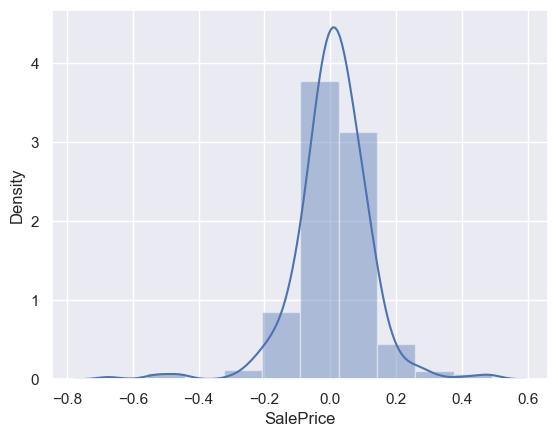

In [183]:
## Plot the Error Distribution
sns.set()
sns.distplot((y_test-y_pred_test), bins=10)
plt.show()

In [184]:
## Tabulate the Results for the three models that we have created
# Tabel that contains all the metrics:
lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.878990,0.933688,0.939439
1,R2 Score (Test),0.877056,0.906006,0.913980
2,RSS (Train),17.269558,9.463527,8.642711
3,RSS (Test),8.007925,6.122285,5.602873
4,MSE (Train),0.132009,0.097721,0.093387
5,MSE (Test),0.137267,0.120022,0.114818


<font color="blue"> Lasso provides the best results

In [185]:
## Coeffcients and Betas
pd.set_option("display.max_rows", None)

betas = pd.DataFrame(index=X_train.columns)
betas.rows = X_train.columns
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_
betas['Linear']= 0
betas

,Ridge,Lasso,Linear
LotFrontage,0.055253,0.061192,0
OverallCond,0.195735,0.289277,0
MasVnrArea,0.030175,0.000000,0
BsmtFinSF1,0.157150,0.139004,0
BsmtFinSF2,0.048398,0.053038,0
BsmtUnfSF,0.044214,-0.000000,0
TotalBsmtSF,0.161718,0.272770,0
1stFlrSF,0.194324,0.053500,0
2ndFlrSF,0.107313,0.044969,0
GrLivArea,0.261517,0.516172,0


In [186]:
val = 0
for x in list(X_train_rfe.columns):
    betas.loc[x,"Linear"]= lr2.coef_[val]
    val = val + 1

betas 


,Ridge,Lasso,Linear
LotFrontage,0.055253,0.061192,0.000000
OverallCond,0.195735,0.289277,0.514067
MasVnrArea,0.030175,0.000000,0.000000
BsmtFinSF1,0.157150,0.139004,0.186071
BsmtFinSF2,0.048398,0.053038,0.000000
BsmtUnfSF,0.044214,-0.000000,0.000000
TotalBsmtSF,0.161718,0.272770,0.564367
1stFlrSF,0.194324,0.053500,0.000000
2ndFlrSF,0.107313,0.044969,0.000000
GrLivArea,0.261517,0.516172,0.859359


In [187]:
## Finding 10 most important featues of these models 
betas["ABSRidge"]=abs(betas["Ridge"])
betas['ABSLasso']=abs(betas["Lasso"])
betas['ABSLinear']=abs(betas['Linear'])

betas["RidgeRank"]=betas["ABSRidge"].rank()
betas["LassoRank"]=betas["ABSLasso"].rank()
betas["LinearRank"]=betas["ABSLinear"].rank()

Ridge_imp = pd.DataFrame(betas.sort_values(by="RidgeRank",ascending= False).head(10).Ridge)
Lasso_imp = pd.DataFrame(betas.sort_values(by="LassoRank",ascending= False).head(10).Lasso)
Linear_imp = pd.DataFrame(betas.sort_values(by="LinearRank",ascending= False).head(10).Linear)
out="Ridge Regression:\n("
for x in range(len(Ridge_imp)):
    out=out+str(Ridge_imp.index[x])+"*"+str(round(Ridge_imp['Ridge'][x],3))+")"
    if x!=len(Ridge_imp)-1:
        out=out+"\n("
        
print(out)

Ridge Regression:
(GrLivArea*0.262)
(OverallCond*0.196)
(1stFlrSF*0.194)
(TotalBsmtSF*0.162)
(BsmtFinSF1*0.157)
(OverallQual_EX*0.141)
(LogLotArea*0.14)
(Age*-0.129)
(OverallQual_PO*-0.128)
(MSZoning_FV*0.125)


In [188]:
out="Lasso Regression:\n("
for x in range(len(Lasso_imp)):
    out=out+Lasso_imp.index[x]+"*"+str(round(Lasso_imp['Lasso'][x],3))+")"
    if x!=len(Lasso_imp)-1:
        out=out+"\n("
        
print(out)

Lasso Regression:
(GrLivArea*0.516)
(MSZoning_FV*0.349)
(OverallCond*0.289)
(Age*-0.275)
(TotalBsmtSF*0.273)
(MSZoning_RH*0.27)
(MSZoning_RL*0.267)
(OverallQual_PO*-0.255)
(MSZoning_RM*0.224)
(LogLotArea*0.22)


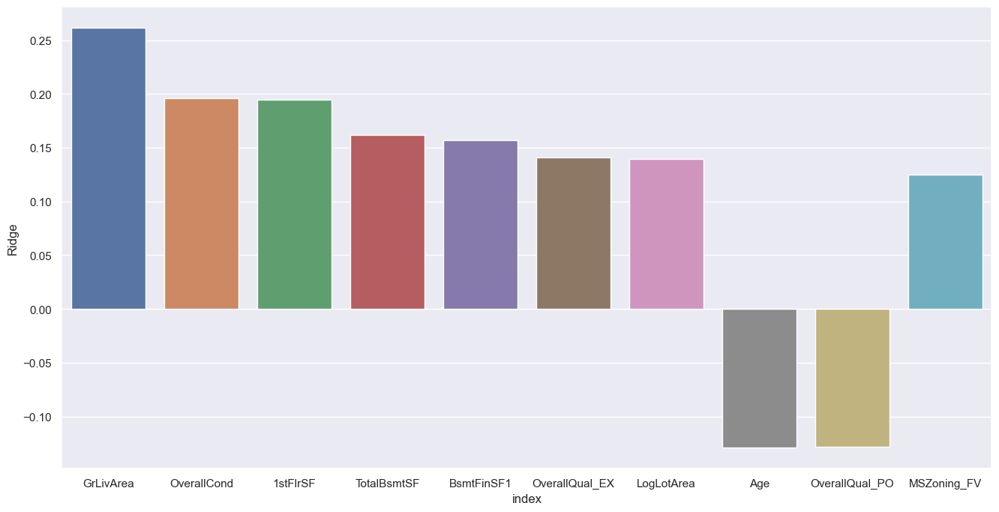

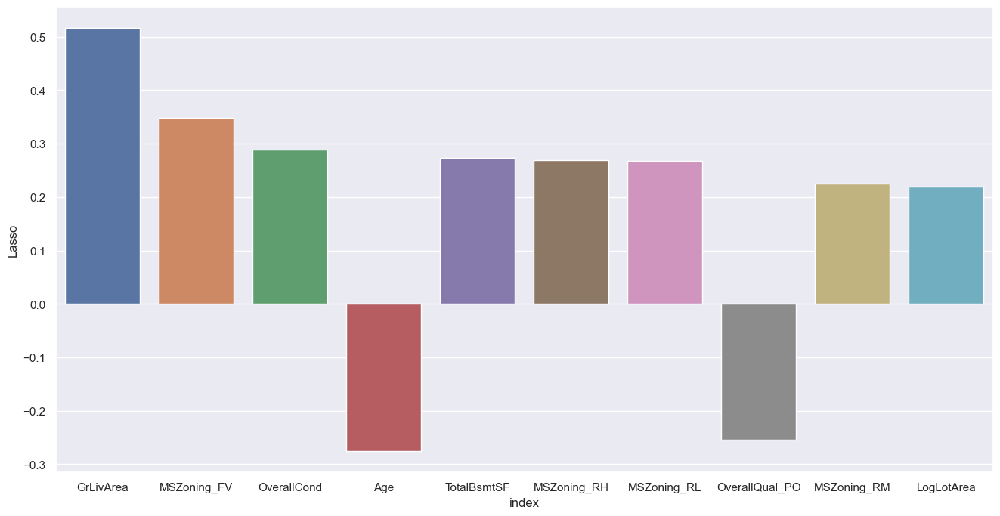

In [189]:
## Visualization and the Evaluation of the Features
sns.set()
Ridge_imp=Ridge_imp.reset_index()
plt.figure(figsize=(16,8))
sns.barplot(x="index",y="Ridge",data=Ridge_imp)

Lasso_imp=Lasso_imp.reset_index()
plt.figure(figsize=(16,8))
sns.barplot(x="index",y="Lasso",data=Lasso_imp)
plt.show()


In [190]:
Ridge_imp

,index,Ridge
0,GrLivArea,0.261517
1,OverallCond,0.195735
2,1stFlrSF,0.194324
3,TotalBsmtSF,0.161718
4,BsmtFinSF1,0.157150
5,OverallQual_EX,0.140760
6,LogLotArea,0.139931
7,Age,-0.128913
8,OverallQual_PO,-0.128421
9,MSZoning_FV,0.124611


In [191]:
Lasso_imp

,index,Lasso
0,GrLivArea,0.516172
1,MSZoning_FV,0.348760
2,OverallCond,0.289277
3,Age,-0.275433
4,TotalBsmtSF,0.272770
5,MSZoning_RH,0.269544
6,MSZoning_RL,0.267364
7,OverallQual_PO,-0.254681
8,MSZoning_RM,0.224446
9,LogLotArea,0.219857


<font color="blue"> 

Inference

Ridge and Lasso have produced higher results compared to Basic

R2 Score (Train)
 * Ridge 93.3% <p>
 * Lasso 93.9% <p>

R2 Score (Test)		
 * Ridge 90.6%  <p>
 * Lasso 91.3% <p>



### Assignment Questions

#### Q1: 

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

In [192]:
## Create Ridge Model with Double the value of Alphas
alpha = 8
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 4.32302104e-02  1.56059077e-01  3.84376822e-02  1.41987211e-01
  3.01173310e-02  4.13789130e-02  1.40898972e-01  1.73195174e-01
  8.60406406e-02  2.30701268e-01  4.42426689e-02  1.22229483e-02
  8.28927894e-02  5.42712686e-02  2.17515424e-02 -2.52963238e-02
  6.94440435e-02  4.61961976e-02  2.65672514e-02  6.68270450e-02
  7.73527189e-02  6.71826069e-02  7.18661319e-02  4.26712521e-02
  6.12012102e-02  4.64237077e-02  1.44832617e-03 -1.35147141e-02
  1.10751076e-01 -8.96552482e-02 -8.30818293e-02 -3.34938163e-03
  2.53981480e-02 -4.39656300e-02 -3.22175380e-03 -1.01883865e-02
 -1.44215896e-02  7.16061665e-03  2.88078663e-03  5.00062605e-02
 -5.89694305e-02 -5.04404755e-03  1.01158328e-02  1.81174420e-03
  9.35514039e-03  8.67649397e-02  3.48383037e-02  5.56343490e-02
  1.23187420e-02  1.14798554e-02 -2.23615937e-04  4.17598198e-03
  3.24938600e-02 -3.75605673e-02 -2.93701794e-03 -1.88228415e-02
  2.97992070e-03 -2.32952187e-03  3.12376441e-02  6.60991619e-03
 -1.30487041e-02  9.26667

In [193]:
## Evaluate Metrics
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)

0.9279887330976384
0.9010222591920258


In [194]:
betas3 = pd.DataFrame(index=X_train.columns)
betas3.rows = X_train.columns
betas3['Ridge'] = ridge.coef_
betas3["ABSRidge"]=abs(betas3["Ridge"])
betas3["RidgeRank"]=betas3["ABSRidge"].rank()

Ridge_imp2=pd.DataFrame(betas3.sort_values(by="RidgeRank",ascending= False).head(10).Ridge)
out="Ridge Regression:\n("
for x in range(len(Ridge_imp2)):
    out=out+str(Ridge_imp2.index[x])+"*"+str(round(Ridge_imp2['Ridge'][x],3))+")"
    if x!=len(Ridge_imp2)-1:
        out=out+"\n("
        
print(out)

Ridge Regression:
(GrLivArea*0.231)
(1stFlrSF*0.173)
(OverallCond*0.156)
(BsmtFinSF1*0.142)
(TotalBsmtSF*0.141)
(OverallQual_EX*0.123)
(LogLotArea*0.111)
(OverallQual_FA*-0.097)
(Neighborhood_Crawfor*0.093)
(Age*-0.09)


In [195]:
# Create Lasso Model With double alpha value .
lasso2 = Lasso()
# cross validation
model_cv = GridSearchCV(estimator = lasso2, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [196]:
## Double the Lasso to .0002 from .0001
alpha =0.0002
lasso2 = Lasso(alpha=alpha)
lasso2.fit(X_train, y_train)

Lasso(alpha=0.0002)

In [197]:
## Evaluate Metrics
y_pred_train = lasso2.predict(X_train)
y_pred_test = lasso2.predict(X_test)

r2_train_lr = r2_score(y_train, y_pred_train)
print("R2 Train:",r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2 Test:",r2_test_lr)

R2 Train: 0.9366268426326874
R2 Test: 0.912518193111227


In [198]:
betas4 = pd.DataFrame(index=X_train.columns)
betas4.rows = X_train.columns
betas4['Lasso'] = lasso2.coef_
betas4["ABSLasso"]=abs(betas4["Lasso"])
betas4["LassoRank"]=betas4["ABSLasso"].rank()
Lasso_imp2=pd.DataFrame(betas4.sort_values(by="LassoRank",ascending= False).head(10).Lasso)
out="Lasso Regression:\n("
for x in range(len(Lasso_imp2)):
    out=out+str(Lasso_imp2.index[x])+"*"+str(round(Lasso_imp2['Lasso'][x],3))+")"
    if x!=len(Lasso_imp2)-1:
        out=out+"\n("
        
print(out)

Lasso Regression:
(GrLivArea*0.57)
(OverallCond*0.297)
(TotalBsmtSF*0.283)
(Age*-0.275)
(OverallQual_PO*-0.259)
(MSZoning_FV*0.242)
(LogLotArea*0.209)
(OverallQual_EX*0.182)
(MSZoning_RL*0.159)
(MSZoning_RH*0.15)


#### Q3: 
After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

In [199]:
# Building the lasso model not including the significant features
dro_cols=["GrLivArea","TotalBsmtSF","MSZoning_FV","MSZoning_RH","OverallCond"]
X_train_miss=X_train.drop(dro_cols,axis=1)

In [200]:
## Initialize Lasso and Build the Model
lasso2 = Lasso()
# cross validation
model_cv2 = GridSearchCV(estimator = lasso2, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv2.fit(X_train_miss, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [201]:
print(model_cv2.best_params_)
alpha =0.0001
lasso2= Lasso(alpha=alpha)
lasso2.fit(X_train_miss, y_train)

{'alpha': 0.001}


Lasso(alpha=0.0001)

In [202]:
## Final Evaluation of the model
X_test_miss=X_test.drop(dro_cols,axis=1)
y_pred_train = lasso2.predict(X_train_miss)
y_pred_test = lasso2.predict(X_test_miss)
r2_train_lr = r2_score(y_train, y_pred_train)
print("R2 Train:",r2_train_lr)
r2_test_lr = r2_score(y_test, y_pred_test)
print("R2 Test:",r2_test_lr)
betas2 = pd.DataFrame(index=X_train_miss.columns)
betas2.rows = X_train_miss.columns
betas2['Lasso'] = lasso2.coef_
betas2['ABSLasso']=abs(betas2["Lasso"])
betas2["LassoRank"]=betas2["ABSLasso"].rank()
Lasso_imp2=pd.DataFrame(betas2.sort_values(by="LassoRank",ascending= False).head(10).Lasso)
out="Lasso Regression:\n("
for x in range(len(Lasso_imp)):
    out=out+Lasso_imp2.index[x]+"*"+str(round(Lasso_imp2['Lasso'][x],3))+")"
    if x!=len(Lasso_imp2)-1:
        out=out+"\n("
        
print(out)

R2 Train: 0.9321655784025793
R2 Test: 0.8940956892817746
Lasso Regression:
(1stFlrSF*0.559)
(OverallQual_PO*-0.444)
(2ndFlrSF*0.36)
(BsmtFinSF1*0.261)
(LogLotArea*0.222)
(PoolArea*0.183)
(OverallQual_EX*0.177)
(OverallQual_FA*-0.17)
(Age*-0.168)
(BsmtCond_Po*-0.152)


<font color="green">
Inference:

 * R2 Train: 93.6% 
 * R2 Test: 90.5%


## Conclusion: 

After using Lasso and Ridge Regulaziation techniques, the following are the most important features which can be used to predict the house price:
1. The higher values of positive coeficients suggest a high sale value.
 * GrLivArea	
 * MSZoning_FV	
 * OverallCond
 * TotalBsmtSF	
 * MSZoning_RH
 * MSZoning_RL
 * MSZoning_RM
 * LogLotArea

2. The higher values of negative coefficients suggest a decrease in sale value.Some of those features are:
 * OverallQual_PO	
 * Age

3. Lastly,when the market value of the property is lower than the Predicted Sale Price, its the time to buy.